In [ ]:
!nvidia-smi


Sat May  9 14:59:09 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install ultralytics kagglehub pyyaml -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 32.5 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 43.1/112.6 GB disk)


In [ ]:
!pip install ultralytics -q

In [ ]:
from ultralytics import YOLO
import ultralytics

ultralytics.checks()

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 43.1/112.6 GB disk)


In [ ]:
import kagglehub

dataset_path = kagglehub.dataset_download(
    "snehilsanyal/construction-site-safety-image-dataset-roboflow"
)

print("Dataset downloaded at:", dataset_path)

Using Colab cache for faster access to the 'construction-site-safety-image-dataset-roboflow' dataset.
Dataset downloaded at: /kaggle/input/construction-site-safety-image-dataset-roboflow


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"nasiralics","key":"0eb4c03ed2f97cfdf9d8d712ecd6e2b4"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d snehilsanyal/construction-site-safety-image-dataset-roboflow -p /content/dataset --unzip

Dataset URL: https://www.kaggle.com/datasets/snehilsanyal/construction-site-safety-image-dataset-roboflow
License(s): Attribution 4.0 International (CC BY 4.0)
100% 206M/206M [00:01<00:00, 123MB/s]



In [ ]:
import os
import glob
import random
import yaml
from pathlib import Path
from IPython.display import Image, display

In [ ]:
import os

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    if level < 2:
        for file in files[:5]:
            print(f"{indent}  {file}")

construction-site-safety-image-dataset-roboflow/
  css-data/
    README.dataset.txt
    README.roboflow.txt
    valid/
      labels/
      images/
    test/
      labels/
      images/
    train/
      labels/
      images/
  source_files/
    source_files/
  results_yolov8n_100e/
    kaggle/
      working/
        runs/
          detect/
            train/
              weights/


In [ ]:
import glob

yaml_files = glob.glob(dataset_path + "/**/*.yaml", recursive=True)
yaml_files

['/kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/ppe_data.yaml',
 '/kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/runs/detect/train/args.yaml']

In [ ]:
data_yaml = yaml_files[0]
print("Using YAML:", data_yaml)

with open(data_yaml, "r") as f:
    print(f.read())

Using YAML: /kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/ppe_data.yaml
{names: [Hardhat, Mask, NO-Hardhat, NO-Mask, NO-Safety Vest, Person, Safety Cone,
    Safety Vest, machinery, vehicle], nc: 10, test: /kaggle/input/construction-site-safety-image-dataset-roboflow/test,
  train: /kaggle/input/construction-site-safety-image-dataset-roboflow/train, val: /kaggle/input/construction-site-safety-image-dataset-roboflow/valid}



In [ ]:
print("Dataset path:", dataset_path)

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}{os.path.basename(root)}/")

    if level >= 3:
        dirs[:] = []

Dataset path: /kaggle/input/construction-site-safety-image-dataset-roboflow
construction-site-safety-image-dataset-roboflow/
  css-data/
    valid/
      labels/
      images/
    test/
      labels/
      images/
    train/
      labels/
      images/
  source_files/
    source_files/
  results_yolov8n_100e/
    kaggle/
      working/


In [ ]:
yaml_files = glob.glob(str(Path(dataset_path) / "**" / "*.yaml"), recursive=True)

print("YAML files found:")
for y in yaml_files:
    print(y)

if len(yaml_files) == 0:
    raise FileNotFoundError("No data.yaml file found. Dataset may not be downloaded correctly.")

data_yaml = yaml_files[0]
print("\nUsing YAML:", data_yaml)

YAML files found:
/kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/ppe_data.yaml
/kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/runs/detect/train/args.yaml

Using YAML: /kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working/ppe_data.yaml


In [ ]:
dataset_path_obj = Path(dataset_path)

possible_train_images = glob.glob(str(dataset_path_obj / "**" / "train" / "images"), recursive=True)

print("Possible train/images folders found:")
for p in possible_train_images:
    print(p)

if len(possible_train_images) == 0:
    raise FileNotFoundError("No train/images folder found. Dataset folder structure is different or download failed.")

train_images_dir = Path(possible_train_images[0])
dataset_root = train_images_dir.parent.parent

print("\nCorrect dataset root is:")
print(dataset_root)

print("\nExpected folders:")
print("Train images:", dataset_root / "train" / "images")
print("Train labels:", dataset_root / "train" / "labels")
print("Valid images:", dataset_root / "valid" / "images")
print("Valid labels:", dataset_root / "valid" / "labels")

Possible train/images folders found:
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/train/images

Correct dataset root is:
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data

Expected folders:
Train images: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/train/images
Train labels: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/train/labels
Valid images: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/valid/images
Valid labels: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/valid/labels


In [ ]:
image_extensions = ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]

train_images = []
for ext in image_extensions:
    train_images.extend(glob.glob(str(dataset_root / "train" / "images" / ext)))

label_files = glob.glob(str(dataset_root / "train" / "labels" / "*.txt"))

print("Total train images:", len(train_images))
print("Total label files:", len(label_files))

if len(train_images) == 0:
    raise FileNotFoundError("No training images found. Check dataset_root path.")

if len(label_files) == 0:
    raise FileNotFoundError("No label files found. Check train/labels folder.")

print("\nSample label file:")
with open(label_files[0], "r") as f:
    print(f.read())

Total train images: 2605
Total label files: 2605

Sample label file:
9 0.56171875 0.0234375 0.0578125 0.046875
5 0.20703125 0.1703125 0.0328125 0.0859375
7 0.21171875 0.165625 0.0140625 0.03125
8 0.2125 0.26953125 0.425 0.5390625
4 0.8 0.178125 0.4 0.35625
1 0.865625 0.16875 0.26875 0.30625
5 0.8 0.309375 0.4 0.61875
8 0.35 0.88125 0.284375 0.2375
9 0.8 0.809375 0.4 0.38125


In [ ]:
import os
import glob
import random
import cv2
import yaml
import matplotlib.pyplot as plt
from pathlib import Path

# Use your fixed yaml file
yaml_path = fixed_yaml   # example: "/content/ppe_data.yaml"

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

names = data["names"]

# Convert names to normal dictionary format
if isinstance(names, list):
    class_names = {i: name for i, name in enumerate(names)}
else:
    class_names = names

print("Classes:")
print(class_names)

Classes:
{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [ ]:
image_extensions = ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]

train_images = []

for ext in image_extensions:
    train_images.extend(glob.glob(str(dataset_root / "train" / "images" / ext)))

print("Total train images:", len(train_images))
print("Example image:", train_images[0] if len(train_images) > 0 else "No image found")

Total train images: 2605
Example image: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/train/images/mms_00692_jpg.rf.a67d77e378aa35ede794ddd1946cc877.jpg


In [ ]:
def draw_yolo_labels(image_path, class_names):
    image_path = Path(image_path)

    # Label path: train/images/img.jpg -> train/labels/img.txt
    label_path = Path(str(image_path).replace("/images/", "/labels/")).with_suffix(".txt")

    img = cv2.imread(str(image_path))

    if img is None:
        print("Image not readable:", image_path)
        return None

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    if not label_path.exists():
        cv2.putText(
            img,
            "NO LABEL FILE",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (255, 0, 0),
            2
        )
        return img

    with open(label_path, "r") as f:
        lines = f.readlines()

    if len(lines) == 0:
        cv2.putText(
            img,
            "EMPTY LABEL FILE",
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (255, 0, 0),
            2
        )
        return img

    for line in lines:
        values = line.strip().split()

        if len(values) < 5:
            continue

        class_id = int(float(values[0]))
        x_center = float(values[1])
        y_center = float(values[2])
        box_width = float(values[3])
        box_height = float(values[4])

        # Convert YOLO format to pixel coordinates
        x1 = int((x_center - box_width / 2) * w)
        y1 = int((y_center - box_height / 2) * h)
        x2 = int((x_center + box_width / 2) * w)
        y2 = int((y_center + box_height / 2) * h)

        class_name = class_names.get(class_id, str(class_id))

        # Draw bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw class label
        cv2.putText(
            img,
            class_name,
            (x1, max(y1 - 10, 20)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (255, 0, 0),
            2
        )

    return img

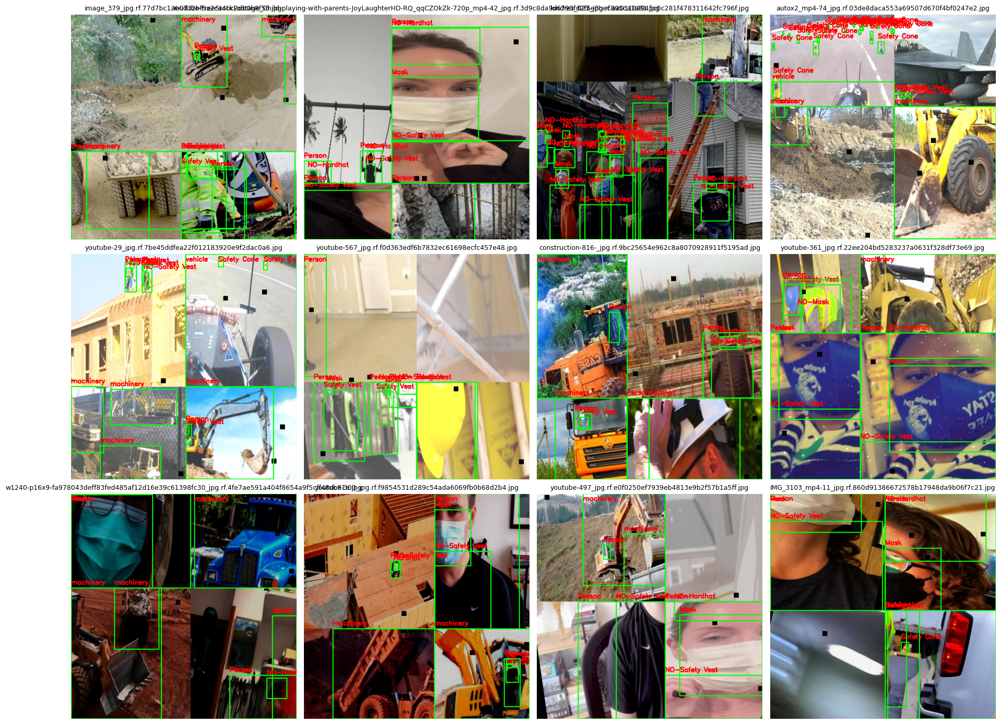

In [ ]:
num_images = 12

if len(train_images) < num_images:
    num_images = len(train_images)

sample_images = random.sample(train_images, num_images)

plt.figure(figsize=(18, 14))

for i, img_path in enumerate(sample_images):
    labeled_img = draw_yolo_labels(img_path, class_names)

    plt.subplot(3, 4, i + 1)
    plt.imshow(labeled_img)
    plt.axis("off")
    plt.title(Path(img_path).name, fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
invalid_labels = []

label_files = glob.glob(str(dataset_root / "train" / "labels" / "*.txt"))

for label_file in label_files:
    with open(label_file, "r") as f:
        lines = f.readlines()

    for line_no, line in enumerate(lines, start=1):
        values = line.strip().split()

        if len(values) != 5:
            invalid_labels.append((label_file, line_no, "Wrong number of values", line))
            continue

        try:
            class_id = int(float(values[0]))
            x_center = float(values[1])
            y_center = float(values[2])
            box_width = float(values[3])
            box_height = float(values[4])

            if class_id not in class_names:
                invalid_labels.append((label_file, line_no, "Invalid class id", line))

            if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and 0 <= box_width <= 1 and 0 <= box_height <= 1):
                invalid_labels.append((label_file, line_no, "Values not normalized", line))

        except:
            invalid_labels.append((label_file, line_no, "Value conversion error", line))

print("Total label files:", len(label_files))
print("Invalid labels found:", len(invalid_labels))

if len(invalid_labels) > 0:
    print("\nFirst 10 invalid labels:")
    for item in invalid_labels[:10]:
        print(item)
else:
    print("All labels look correct.")

Total label files: 2605
Invalid labels found: 0
All labels look correct.


In [ ]:
# . Final path check before training

In [ ]:
import os
import glob
import random
import shutil
from pathlib import Path
from IPython.display import Image, display

print("Dataset root:", dataset_root)
print("Fixed YAML:", fixed_yaml)

print("\nChecking folders:")
print("Train images:", os.path.exists(dataset_root / "train" / "images"))
print("Train labels:", os.path.exists(dataset_root / "train" / "labels"))
print("Valid images:", os.path.exists(dataset_root / "valid" / "images"))
print("Valid labels:", os.path.exists(dataset_root / "valid" / "labels"))

train_images = glob.glob(str(dataset_root / "train" / "images" / "*"))
valid_images = glob.glob(str(dataset_root / "valid" / "images" / "*"))
train_labels = glob.glob(str(dataset_root / "train" / "labels" / "*.txt"))
valid_labels = glob.glob(str(dataset_root / "valid" / "labels" / "*.txt"))

print("\nTotal train images:", len(train_images))
print("Total valid images:", len(valid_images))
print("Total train labels:", len(train_labels))
print("Total valid labels:", len(valid_labels))

Dataset root: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data
Fixed YAML: /content/ppe_data.yaml

Checking folders:
Train images: True
Train labels: True
Valid images: True
Valid labels: True

Total train images: 2605
Total valid images: 114
Total train labels: 2605
Total valid labels: 114


In [ ]:
3. Choose model

In [ ]:
MODEL_NAME = "yolov8n.pt"
# MODEL_NAME = "yolov8s.pt" for better accuracy
PROJECT_NAME = "construction_ppe_yolov8"
RUN_NAME = "yolov8n_ppe_final"

model = YOLO(MODEL_NAME)

In [ ]:
4. Train YOLOv8 model

**Check your current bad YAML**

In [ ]:
print("Current fixed_yaml:", fixed_yaml)

with open(fixed_yaml, "r") as f:
    print(f.read())

Current fixed_yaml: /content/ppe_data.yaml
names:
- Hardhat
- Mask
- NO-Hardhat
- NO-Mask
- NO-Safety Vest
- Person
- Safety Cone
- Safety Vest
- machinery
- vehicle
nc: 10
path: /kaggle/input/construction-site-safety-image-dataset-roboflow/results_yolov8n_100e/kaggle/working
test: /kaggle/input/construction-site-safety-image-dataset-roboflow/test
train: train/images
val: valid/images



**Copy dataset to /content**

In [ ]:
import os
import glob
import yaml
import shutil
from pathlib import Path

# Your detected correct dataset root
source_dataset_root = Path(dataset_root)

print("Source dataset root:", source_dataset_root)

print("Train images exists:", (source_dataset_root / "train" / "images").exists())
print("Train labels exists:", (source_dataset_root / "train" / "labels").exists())
print("Valid images exists:", (source_dataset_root / "valid" / "images").exists())
print("Valid labels exists:", (source_dataset_root / "valid" / "labels").exists())

# Copy dataset to /content for safe training
local_dataset_root = Path("/content/css-data")

if local_dataset_root.exists():
    shutil.rmtree(local_dataset_root)

shutil.copytree(source_dataset_root, local_dataset_root)

print("Dataset copied to:", local_dataset_root)

print("Local train images:", (local_dataset_root / "train" / "images").exists())
print("Local valid images:", (local_dataset_root / "valid" / "images").exists())

Source dataset root: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data
Train images exists: True
Train labels exists: True
Valid images exists: True
Valid labels exists: True
Dataset copied to: /content/css-data
Local train images: True
Local valid images: True


**Count images and labels**

In [ ]:
vtrain_images = glob.glob(str(local_dataset_root / "train" / "images" / "*"))
valid_images = glob.glob(str(local_dataset_root / "valid" / "images" / "*"))

train_labels = glob.glob(str(local_dataset_root / "train" / "labels" / "*.txt"))
valid_labels = glob.glob(str(local_dataset_root / "valid" / "labels" / "*.txt"))

print("Train images:", len(train_images))
print("Train labels:", len(train_labels))
print("Valid images:", len(valid_images))
print("Valid labels:", len(valid_labels))

if len(train_images) == 0:
    raise FileNotFoundError("No train images found.")

if len(valid_images) == 0:
    raise FileNotFoundError("No valid images found.")

if len(train_labels) == 0:
    raise FileNotFoundError("No train labels found.")

if len(valid_labels) == 0:
    raise FileNotFoundError("No valid labels found.")

Train images: 2605
Train labels: 2605
Valid images: 114
Valid labels: 114


**Create fresh correct YAML file**

In [ ]:
# Try to read class names from original yaml
yaml_candidates = glob.glob(str(source_dataset_root / "**" / "*.yaml"), recursive=True)

print("YAML candidates:")
for y in yaml_candidates:
    print(y)

class_names = None

for y in yaml_candidates:
    try:
        with open(y, "r") as f:
            temp_data = yaml.safe_load(f)

        if temp_data and "names" in temp_data:
            class_names = temp_data["names"]
            print("Class names loaded from:", y)
            break
    except Exception as e:
        print("Skipping YAML:", y, e)

# Backup class names if YAML reading fails
if class_names is None:
    class_names = [
        "Hardhat",
        "Mask",
        "NO-Hardhat",
        "NO-Mask",
        "NO-Safety Vest",
        "Person",
        "Safety Cone",
        "Safety Vest",
        "machinery",
        "vehicle"
    ]

# Convert dictionary names to list if needed
if isinstance(class_names, dict):
    class_names = [class_names[k] for k in sorted(class_names, key=lambda x: int(x))]

clean_yaml_data = {
    "path": str(local_dataset_root),
    "train": "train/images",
    "val": "valid/images",
    "names": class_names,
    "nc": len(class_names)
}

if (local_dataset_root / "test" / "images").exists():
    clean_yaml_data["test"] = "test/images"

clean_yaml_path = "/content/ppe_data_clean.yaml"

with open(clean_yaml_path, "w") as f:
    yaml.dump(clean_yaml_data, f, sort_keys=False)

print("Clean YAML created at:", clean_yaml_path)

with open(clean_yaml_path, "r") as f:
    print(f.read())

YAML candidates:
Clean YAML created at: /content/ppe_data_clean.yaml
path: /content/css-data
train: train/images
val: valid/images
names:
- Hardhat
- Mask
- NO-Hardhat
- NO-Mask
- NO-Safety Vest
- Person
- Safety Cone
- Safety Vest
- machinery
- vehicle
nc: 10
test: test/images



**Verify YAML paths before training**

In [ ]:
with open(clean_yaml_path, "r") as f:
    check_data = yaml.safe_load(f)

check_root = Path(check_data["path"])

train_path = check_root / check_data["train"]
valid_path = check_root / check_data["val"]

print("Train path:", train_path)
print("Valid path:", valid_path)

print("Train path exists:", train_path.exists())
print("Valid path exists:", valid_path.exists())

if not train_path.exists():
    raise FileNotFoundError(f"Train path not found: {train_path}")

if not valid_path.exists():
    raise FileNotFoundError(f"Valid path not found: {valid_path}")

print("YAML is correct. Ready for training.")

Train path: /content/css-data/train/images
Valid path: /content/css-data/valid/images
Train path exists: True
Valid path exists: True
YAML is correct. Ready for training.


**Cell 6: Train YOLOv8 again**

In [ ]:
from ultralytics import YOLO

MODEL_NAME = "yolov8n.pt"
RUN_NAME = "yolov8n_ppe_final"

model = YOLO(MODEL_NAME)

results = model.train(
    data=clean_yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    patience=15,
    project="/content/runs",
    name=RUN_NAME,
    pretrained=True,
    optimizer="auto",
    workers=2,
    verbose=True,
    exist_ok=True
)

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/ppe_data_clean.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_ppe_final, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pat

# 1. Let training complete
2. Check results graphs
3. Load best.pt model
4. Validate model accuracy
5. Test on images
6. Add safety alert logic
7. Test on video/uploaded image
8. Save model to Google Driven

**After training, model path will be**

In [ ]:
best_model_path = f"/content/runs/{RUN_NAME}/weights/best.pt"
last_model_path = f"/content/runs/{RUN_NAME}/weights/last.pt"

print("Best model:", best_model_path)
print("Best exists:", os.path.exists(best_model_path))

Best model: /content/runs/yolov8n_ppe_final/weights/best.pt
Best exists: True


**1. Check trained model files**

In [ ]:
import os

RUN_NAME = "yolov8n_ppe_final"

best_model_path = f"/content/runs/{RUN_NAME}/weights/best.pt"
last_model_path = f"/content/runs/{RUN_NAME}/weights/last.pt"

print("Best model path:", best_model_path)
print("Best model exists:", os.path.exists(best_model_path))

print("Last model path:", last_model_path)
print("Last model exists:", os.path.exists(last_model_path))

Best model path: /content/runs/yolov8n_ppe_final/weights/best.pt
Best model exists: True
Last model path: /content/runs/yolov8n_ppe_final/weights/last.pt
Last model exists: True


**Show training results**

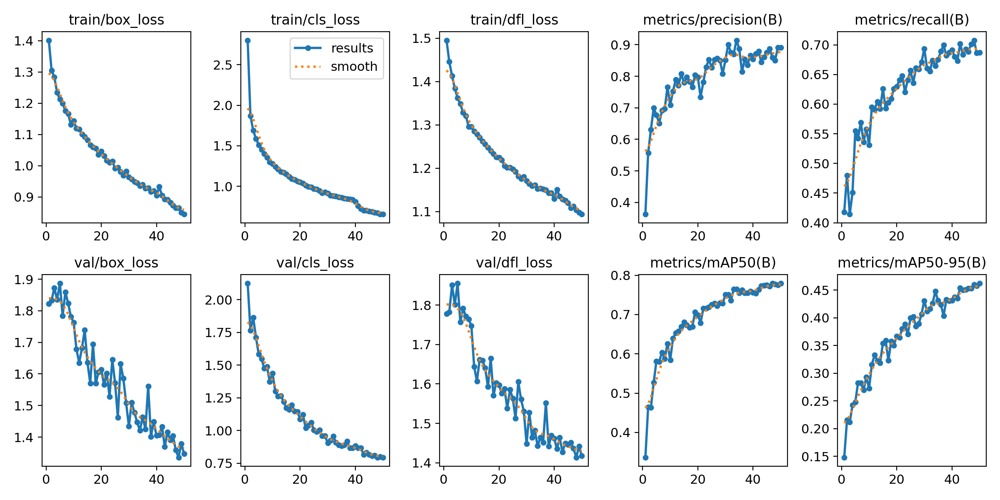

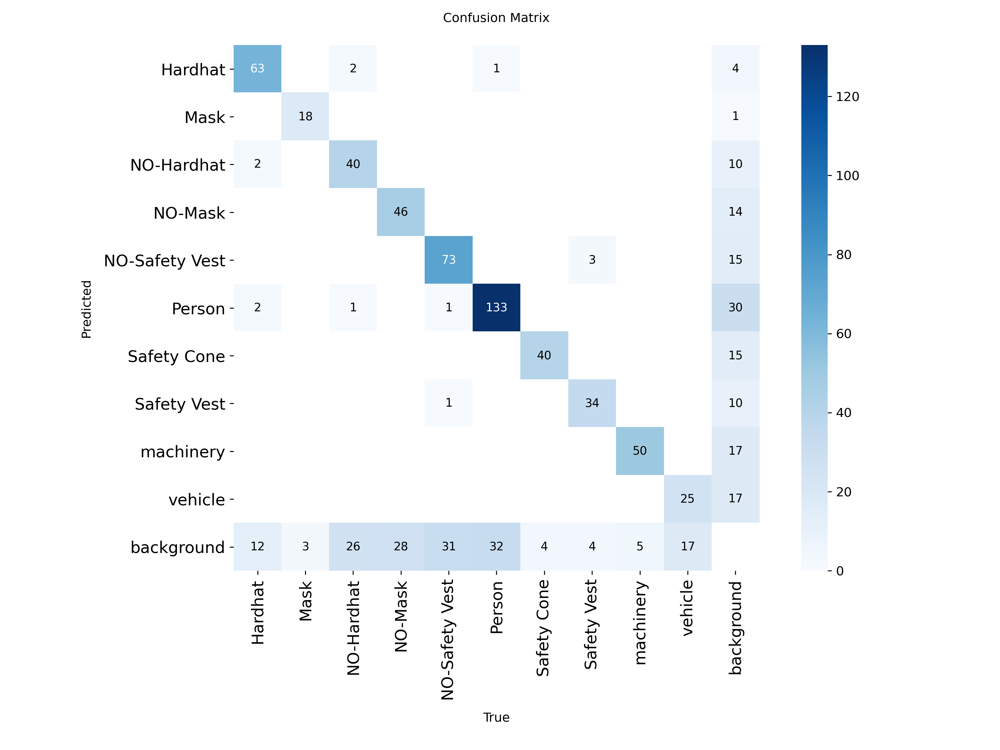

In [ ]:
from IPython.display import Image, display
import os

results_img = f"/content/runs/{RUN_NAME}/results.png"
confusion_img = f"/content/runs/{RUN_NAME}/confusion_matrix.png"
pr_curve = f"/content/runs/{RUN_NAME}/PR_curve.png"
f1_curve = f"/content/runs/{RUN_NAME}/F1_curve.png"

if os.path.exists(results_img):
    display(Image(filename=results_img, width=900))

if os.path.exists(confusion_img):
    display(Image(filename=confusion_img, width=900))

if os.path.exists(pr_curve):
    display(Image(filename=pr_curve, width=900))

if os.path.exists(f1_curve):
    display(Image(filename=f1_curve, width=900))

**3. Load your trained model**

In [ ]:
from ultralytics import YOLO

trained_model = YOLO(best_model_path)

print("Model loaded successfully.")
print("Classes:", trained_model.names)

Model loaded successfully.
Classes: {0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


**4. Validate model accuracy**

# mAP50 = normal accuracy score
mAP50-95 = stricter accuracy score
Higher value = better model

In [ ]:
metrics = trained_model.val(
    data=clean_yaml_path,
    imgsz=640,
    batch=16,
    conf=0.25
)

print("mAP50-95:", metrics.box.map)
print("mAP50:", metrics.box.map50)
print("mAP75:", metrics.box.map75)

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1373.2±321.1 MB/s, size: 59.5 KB)
val: Scanning /content/css-data/valid/labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 114/114 22.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.2it/s 3.6s
                   all        114        697      0.892      0.687       0.72      0.436
               Hardhat         42         79      0.967      0.744      0.771      0.516
                  Mask         19         21      0.951       0.81      0.852      0.613
            NO-Hardhat         37         69      0.936      0.522      0.548      0.305
               NO-Mask         44         74      0.949      0.541      0.595      0.269
        NO-Safety Vest         56        106     

**5. Test on one random image**

Total test images: 82
Testing image: /content/css-data/test/images/0_jpg.rf.2ff49f74309118f169e07aa12564df87.jpg

image 1/1 /content/css-data/test/images/0_jpg.rf.2ff49f74309118f169e07aa12564df87.jpg: 640x640 2 Hardhats, 5 Persons, 2 Safety Vests, 2 vehicles, 7.2ms
Speed: 1.6ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


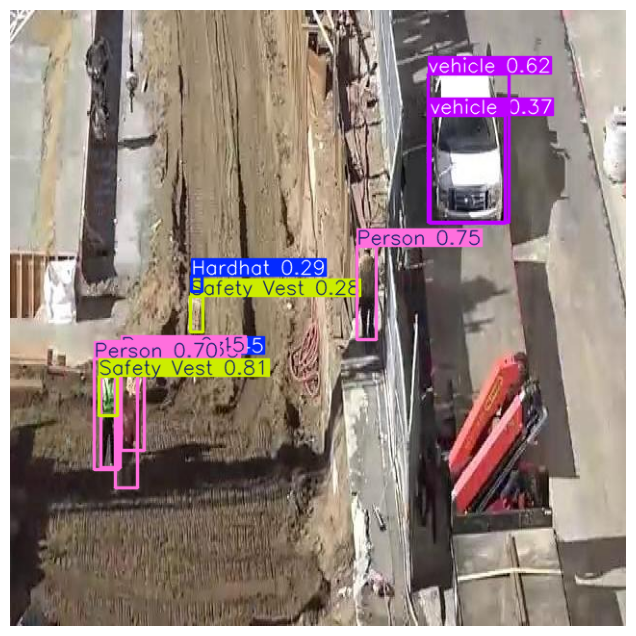

In [ ]:
import glob
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

test_images = glob.glob(str(local_dataset_root / "test" / "images" / "*"))

if len(test_images) == 0:
    test_images = glob.glob(str(local_dataset_root / "valid" / "images" / "*"))

print("Total test images:", len(test_images))

sample_img = random.choice(test_images)
print("Testing image:", sample_img)

results = trained_model.predict(
    source=sample_img,
    conf=0.25,
    save=False
)

result = results[0]
annotated_img = result.plot()

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

**6. Test on 12 random images**


image 1/1 /content/css-data/test/images/construction-651-_jpg.rf.8fa283ce7693dbdf29eb98384f24cb85.jpg: 640x640 1 machinery, 7.6ms
Speed: 1.8ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


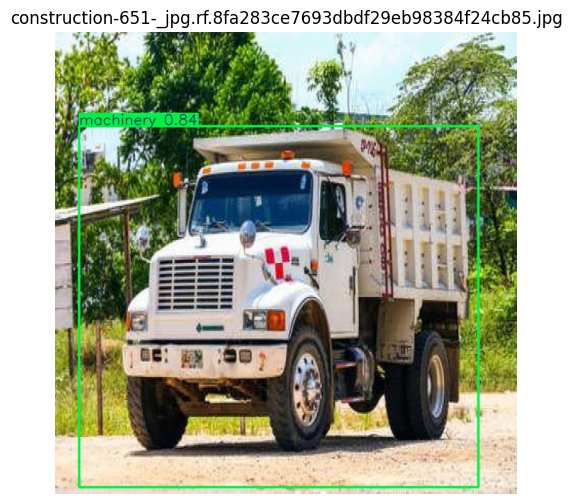


image 1/1 /content/css-data/test/images/003357_jpg.rf.9867f91e88089bb68dc95947d5116d14.jpg: 640x640 1 Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 1 Safety Cone, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


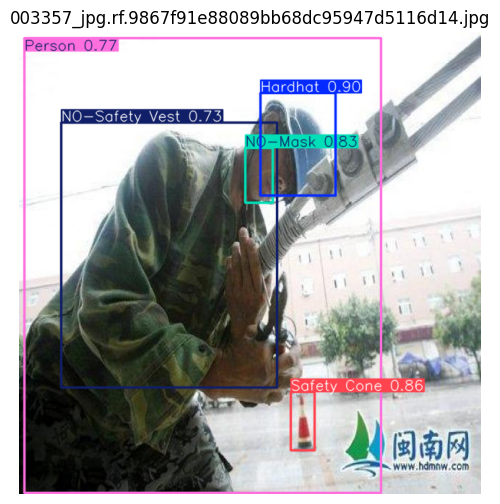


image 1/1 /content/css-data/test/images/autox_mp4-44_jpg.rf.5048603ee6ccedf9ae6e3f787b7f82ff.jpg: 640x640 20 Safety Cones, 1 vehicle, 9.6ms
Speed: 4.0ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


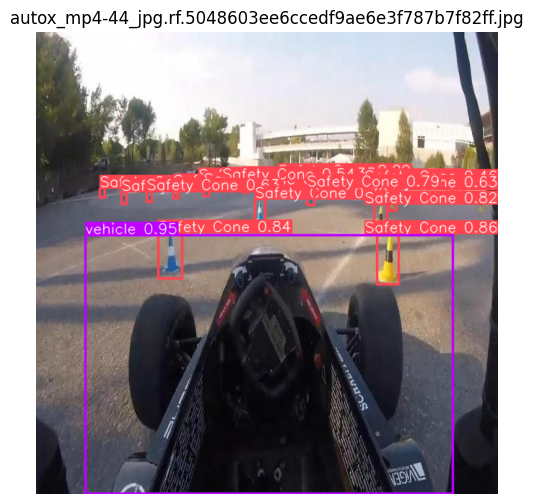


image 1/1 /content/css-data/test/images/construction-2-_mp4-13_jpg.rf.cef0975976346515d438e0c2ce6c59db.jpg: 640x640 2 machinerys, 9.0ms
Speed: 2.7ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


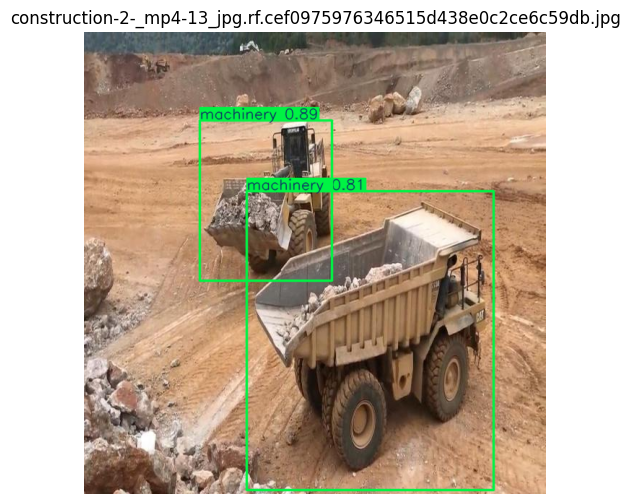


image 1/1 /content/css-data/test/images/004063_jpg.rf.1b7cdc4035bcb24ef69b8798b444053e.jpg: 640x640 6 Hardhats, 4 NO-Safety Vests, 6 Persons, 2 Safety Vests, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


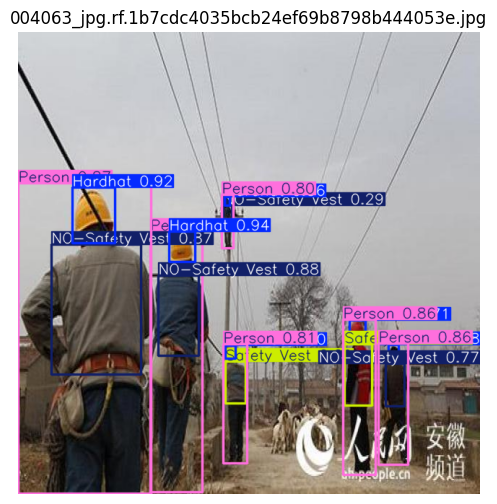


image 1/1 /content/css-data/test/images/IMG_0871_mp4-11_jpg.rf.432092b53ebeb84f4b9b27b40343c9aa.jpg: 640x640 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 15.2ms
Speed: 2.8ms preprocess, 15.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


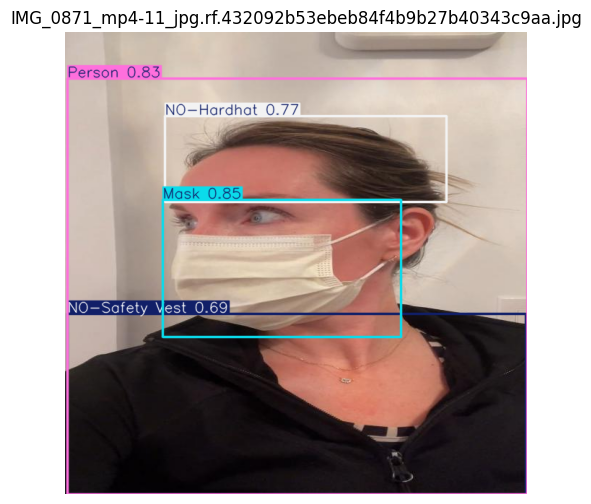


image 1/1 /content/css-data/test/images/youtube-462_jpg.rf.df73aa5089a04b8fbf3adf9d614a6740.jpg: 640x640 2 Hardhats, 2 Persons, 2 Safety Vests, 4 vehicles, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


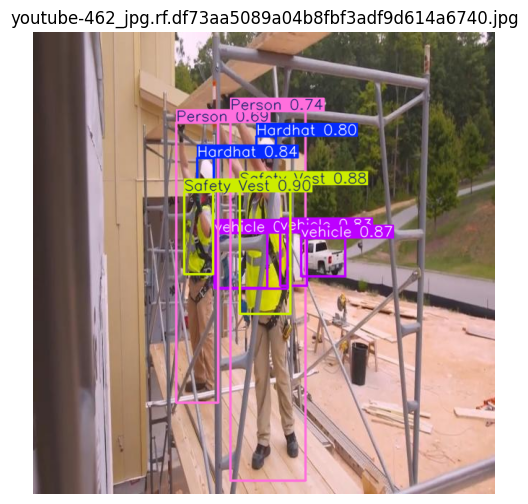


image 1/1 /content/css-data/test/images/class2_131_jpg.rf.ad8314a9273471f1280ce8789ea75376.jpg: 640x640 1 NO-Safety Vest, 1 Person, 18.1ms
Speed: 4.6ms preprocess, 18.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


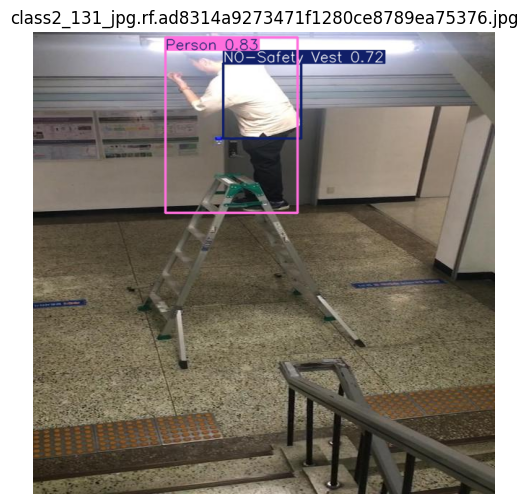


image 1/1 /content/css-data/test/images/IMG_3103_mp4-9_jpg.rf.b31bd2d816465a27aa1eb072f90bb5aa.jpg: 640x640 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


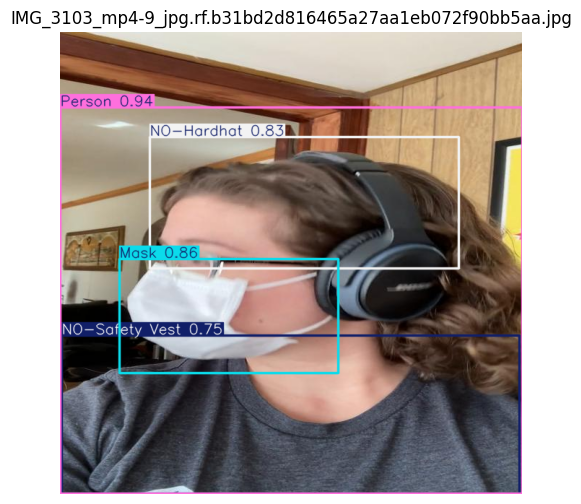


image 1/1 /content/css-data/test/images/youtube-152_jpg.rf.9147878e3ddda845e58f7d9c041f1338.jpg: 640x640 5 Persons, 5 machinerys, 6 vehicles, 14.3ms
Speed: 4.8ms preprocess, 14.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


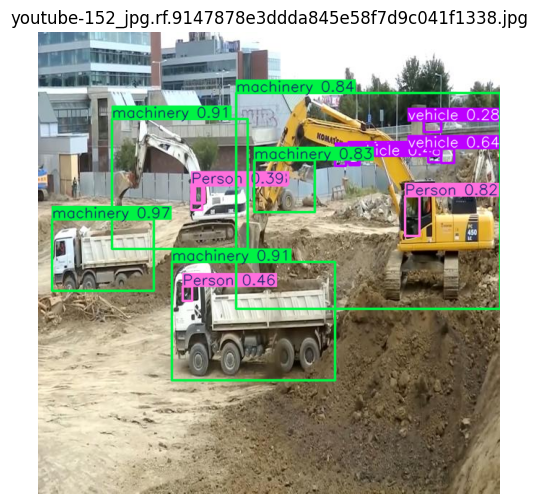


image 1/1 /content/css-data/test/images/IMG_3100_mp4-9_jpg.rf.413ccf5fe4a7ee67f71e07c2c43b6756.jpg: 640x640 1 Hardhat, 1 Mask, 1 NO-Hardhat, 1 NO-Safety Vest, 1 Person, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


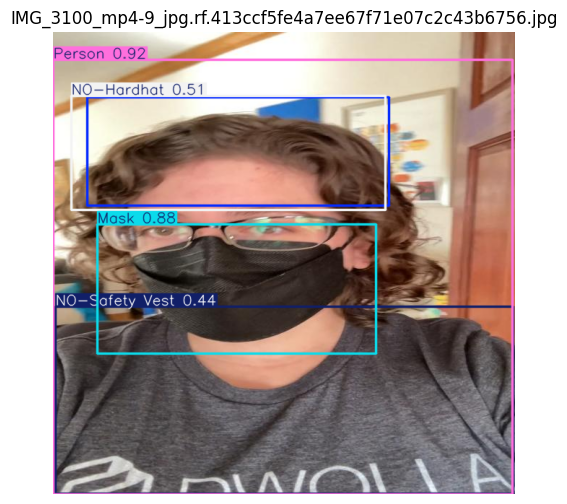


image 1/1 /content/css-data/test/images/class2_145_jpg.rf.b8ed5a5357ee41f8fb1aa9b01a400d51.jpg: 640x640 2 NO-Hardhats, 2 NO-Masks, 2 NO-Safety Vests, 2 Persons, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


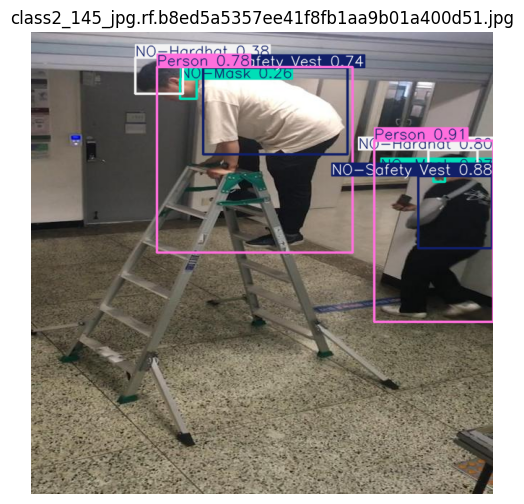

In [ ]:
sample_images = random.sample(test_images, min(12, len(test_images)))

for img_path in sample_images:
    results = trained_model.predict(
        source=img_path,
        conf=0.25,
        save=False
    )

    result = results[0]
    annotated_img = result.plot()

    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(Path(img_path).name)
    plt.show()

**7. Add safety alert logic**

In [ ]:
unsafe_classes = ["NO-Hardhat", "NO-Safety Vest", "NO-Mask"]
safe_classes = ["Hardhat", "Safety Vest", "Mask"]

def safety_detection(image_path, model, conf_threshold=0.25):
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        save=False
    )

    result = results[0]
    img = cv2.imread(str(image_path))

    if img is None:
        print("Image not readable:", image_path)
        return

    violation_count = 0
    total_objects = 0
    class_count = {}

    for box in result.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        class_name = model.names[cls_id]

        x1, y1, x2, y2 = map(int, box.xyxy[0])

        total_objects += 1
        class_count[class_name] = class_count.get(class_name, 0) + 1

        if class_name in unsafe_classes:
            color = (0, 0, 255)
            label = f"ALERT: {class_name} {conf:.2f}"
            violation_count += 1
        elif class_name in safe_classes:
            color = (0, 255, 0)
            label = f"{class_name} {conf:.2f}"
        else:
            color = (255, 255, 0)
            label = f"{class_name} {conf:.2f}"

        cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)
        cv2.putText(
            img,
            label,
            (x1, max(y1 - 10, 25)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            color,
            2
        )

    if violation_count > 0:
        status_text = f"SAFETY ALERT: {violation_count} violation(s) detected"
        status_color = (0, 0, 255)
    else:
        status_text = "SAFE: No PPE violation detected"
        status_color = (0, 255, 0)

    cv2.rectangle(img, (10, 10), (900, 60), (0, 0, 0), -1)
    cv2.putText(
        img,
        status_text,
        (20, 45),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        status_color,
        2
    )

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()

    print("Total objects detected:", total_objects)
    print("Violations detected:", violation_count)
    print("Class count:", class_count)


image 1/1 /content/css-data/test/images/image_53_jpg.rf.3446e366b5d4d905a32e1aedc8fe87de.jpg: 640x640 1 Hardhat, 1 Mask, 1 Person, 1 Safety Vest, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


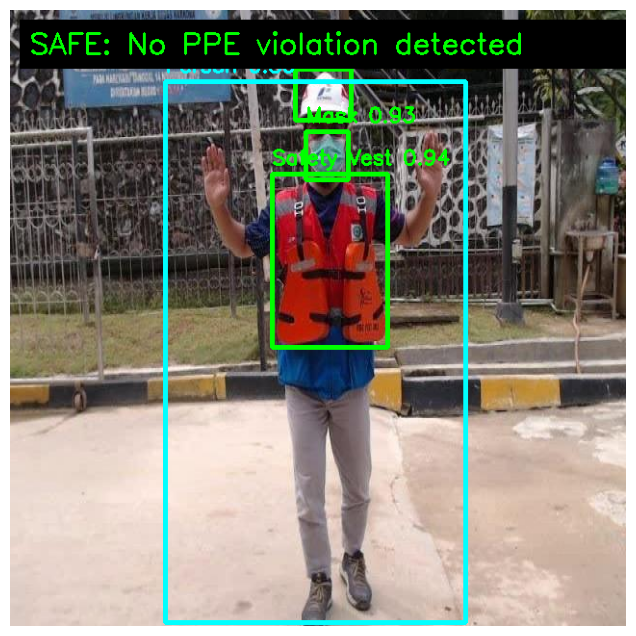

Total objects detected: 4
Violations detected: 0
Class count: {'Hardhat': 1, 'Safety Vest': 1, 'Mask': 1, 'Person': 1}


In [ ]:
sample_img = random.choice(test_images)
safety_detection(sample_img, trained_model, conf_threshold=0.25)


Image: /content/css-data/test/images/construction-675-_jpg.rf.bb4a05441be707256175e04929da3478.jpg

image 1/1 /content/css-data/test/images/construction-675-_jpg.rf.bb4a05441be707256175e04929da3478.jpg: 640x640 1 Person, 1 machinery, 10.1ms
Speed: 3.2ms preprocess, 10.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


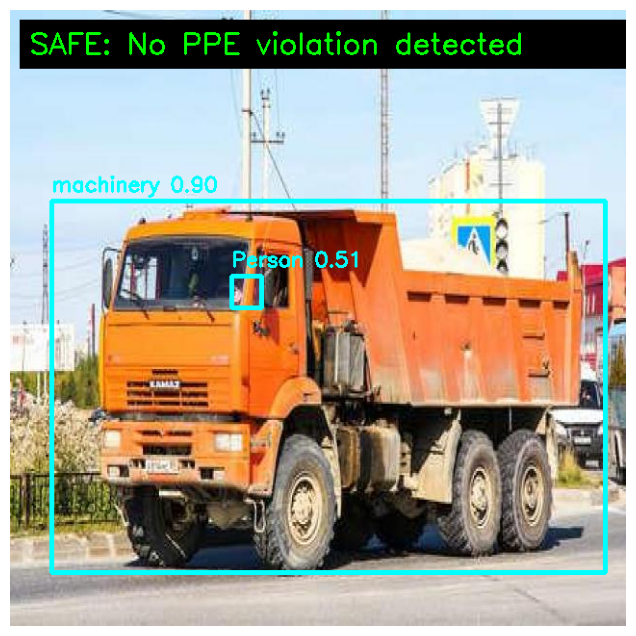

Total objects detected: 2
Violations detected: 0
Class count: {'machinery': 1, 'Person': 1}

Image: /content/css-data/test/images/youtube-114_jpg.rf.5e02b6574ace1f4b3689befbc5051cd0.jpg

image 1/1 /content/css-data/test/images/youtube-114_jpg.rf.5e02b6574ace1f4b3689befbc5051cd0.jpg: 640x640 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 9.7ms
Speed: 4.6ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


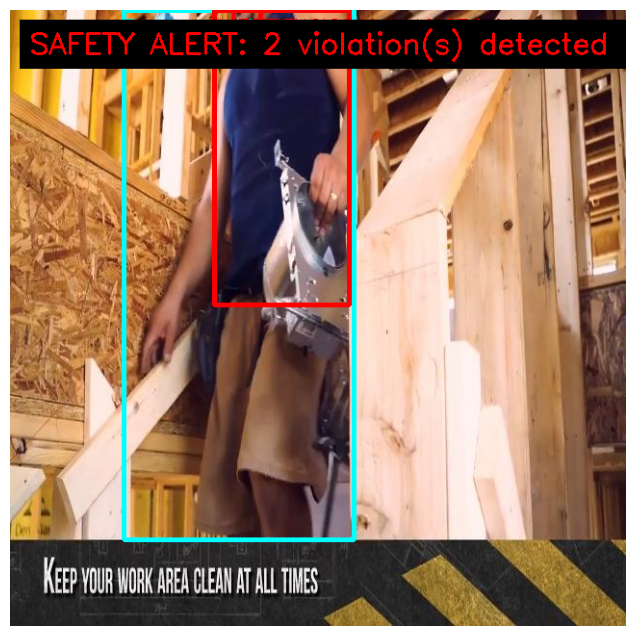

Total objects detected: 3
Violations detected: 2
Class count: {'Person': 1, 'NO-Safety Vest': 1, 'NO-Mask': 1}

Image: /content/css-data/test/images/construction-2-_mp4-84_jpg.rf.e8d6bb0acc5c6e82c1a2d260ddf3135e.jpg

image 1/1 /content/css-data/test/images/construction-2-_mp4-84_jpg.rf.e8d6bb0acc5c6e82c1a2d260ddf3135e.jpg: 640x640 2 machinerys, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


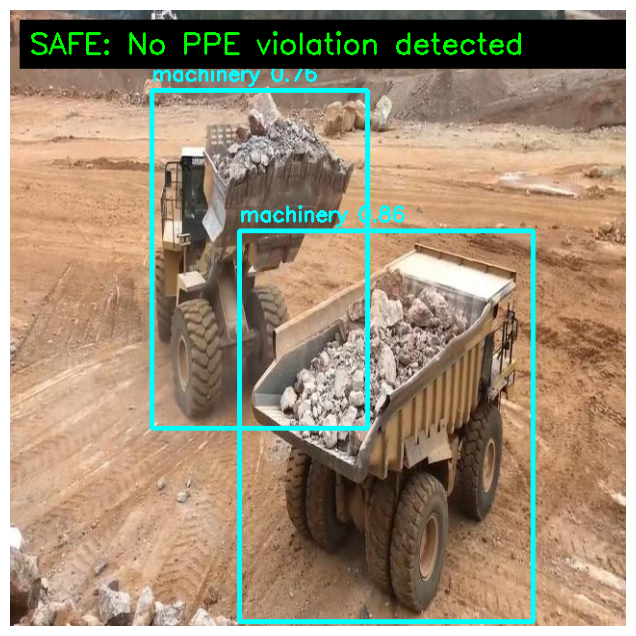

Total objects detected: 2
Violations detected: 0
Class count: {'machinery': 2}

Image: /content/css-data/test/images/construction-2-_mp4-13_jpg.rf.cef0975976346515d438e0c2ce6c59db.jpg

image 1/1 /content/css-data/test/images/construction-2-_mp4-13_jpg.rf.cef0975976346515d438e0c2ce6c59db.jpg: 640x640 2 machinerys, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


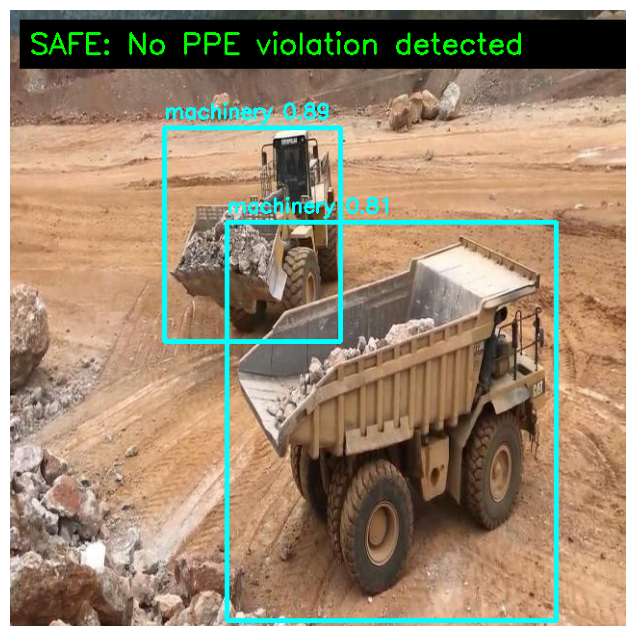

Total objects detected: 2
Violations detected: 0
Class count: {'machinery': 2}

Image: /content/css-data/test/images/2009_000059_jpg.rf.50e8398a37eb33f33fd9f662feeea083.jpg

image 1/1 /content/css-data/test/images/2009_000059_jpg.rf.50e8398a37eb33f33fd9f662feeea083.jpg: 640x640 1 NO-Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 9.8ms
Speed: 2.5ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


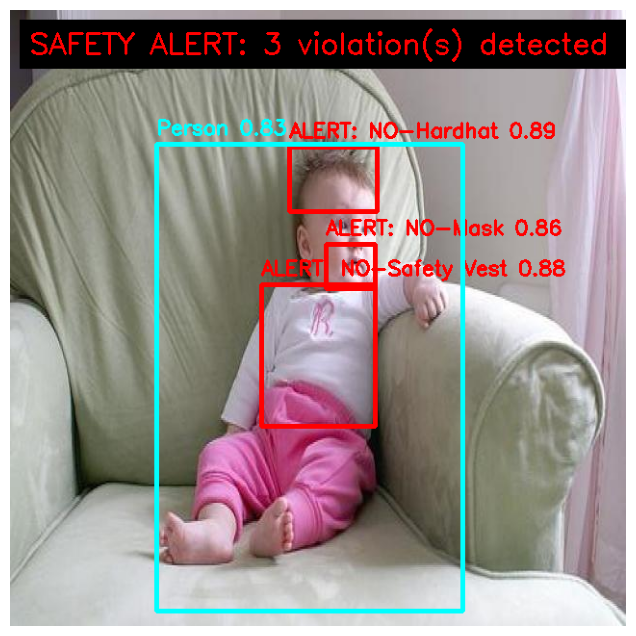

Total objects detected: 4
Violations detected: 3
Class count: {'NO-Hardhat': 1, 'NO-Safety Vest': 1, 'NO-Mask': 1, 'Person': 1}


In [ ]:
# 11. Test custom safety alert on multiple images
for img_path in random.sample(test_images, min(5, len(test_images))):
    print("\nImage:", img_path)
    safety_detection(img_path, trained_model, conf_threshold=0.25)

**8. Upload your own image and test**

Saving IMG-20210921-WA0032.jpg to IMG-20210921-WA0032.jpg
Testing uploaded image: IMG-20210921-WA0032.jpg

image 1/1 /content/IMG-20210921-WA0032.jpg: 512x640 2 NO-Hardhats, 2 NO-Masks, 2 NO-Safety Vests, 2 Persons, 50.3ms
Speed: 4.0ms preprocess, 50.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


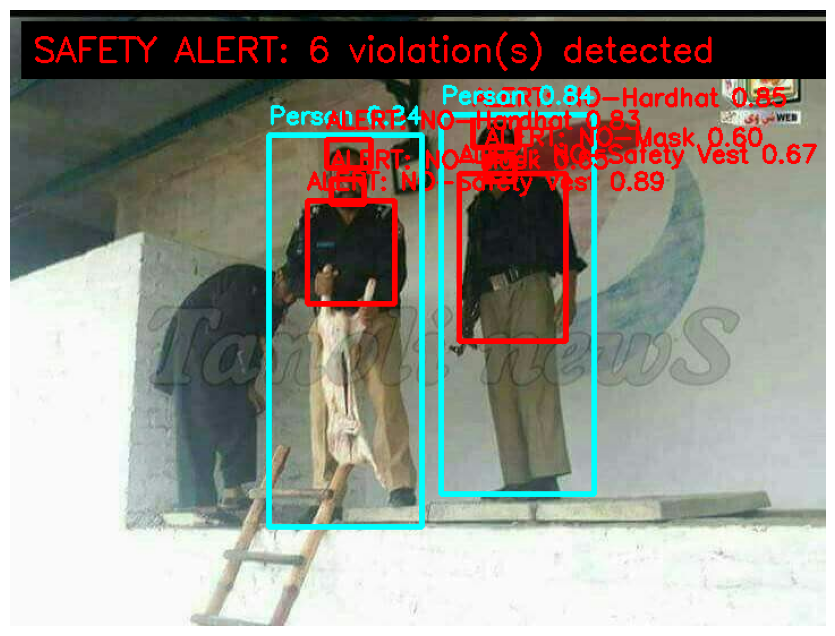

Total objects detected: 8
Violations detected: 6
Class count: {'NO-Safety Vest': 2, 'NO-Hardhat': 2, 'Person': 2, 'NO-Mask': 2}


In [ ]:
from google.colab import files

uploaded = files.upload()

for filename in uploaded.keys():
    print("Testing uploaded image:", filename)
    safety_detection(filename, trained_model, conf_threshold=0.25)

**9. Save prediction results**

In [ ]:
prediction_output = "/content/final_predictions"

trained_model.predict(
    source=str(local_dataset_root / "valid" / "images"),
    conf=0.25,
    save=True,
    project=prediction_output,
    name="ppe_predictions"
)

print("Predictions saved at:", prediction_output)


image 1/114 /content/css-data/valid/images/-1079-_png_jpg.rf.19092a3937930012f9fd9c1ce57f5a7b.jpg: 640x640 2 Hardhats, 1 NO-Mask, 2 NO-Safety Vests, 5 Persons, 1 Safety Cone, 10.8ms
image 2/114 /content/css-data/valid/images/-1429-_png_jpg.rf.78a7894e86c79d018d80fa86f4d000f8.jpg: 640x640 3 Hardhats, 1 NO-Mask, 2 NO-Safety Vests, 2 Persons, 7.6ms
image 3/114 /content/css-data/valid/images/-1969-_png_jpg.rf.41dd58ed3ae83df95fb2417c679d581f.jpg: 640x640 1 Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 7.2ms
image 4/114 /content/css-data/valid/images/-1989-_png_jpg.rf.8cb3d6087bb86d08e693b4250fbf96e3.jpg: 640x640 4 Hardhats, 4 NO-Masks, 5 NO-Safety Vests, 7 Persons, 7.2ms
image 5/114 /content/css-data/valid/images/-211-_png_jpg.rf.eac228e3993f9027795b6400262811e7.jpg: 640x640 1 Hardhat, 3 NO-Masks, 2 Persons, 4 Safety Vests, 7.2ms
image 6/114 /content/css-data/valid/images/-3154-_png_jpg.rf.f118da2b1c20afb78ff93dc7d558f42c.jpg: 640x640 1 Hardhat, 2 NO-Masks, 1 NO-Safety Vest, 1 Person, 7

**Video detection code**

In [ ]:
from google.colab import files

uploaded_video = files.upload()
video_path = list(uploaded_video.keys())[0]

print("Video uploaded:", video_path)

Saving WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4 to WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4
Video uploaded: WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4


In [ ]:
# Run YOLO on video:
video_results = trained_model.predict(
    source=video_path,
    conf=0.25,
    save=True,
    project="/content/video_results",
    name="ppe_video_detection"
)

print("Video prediction completed.")


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/808) /content/WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4: 640x384 4 Hardhats, 3 NO-Hardhats, 3 NO-Masks, 5 NO-Safety Vests, 7 Persons, 42.4ms
video 1/1 (frame 2/808) /content/WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4: 640x384 4 Hardhats, 2 NO-Hardhats, 5 NO-Masks, 4 NO-Safety Vests, 7 Persons, 7.2ms
video 1/1 (frame 3/808) /content/WhatsApp Video 2026-05-09 at 10.13.28 AM.mp4: 640x384 4 Hardhats, 2 NO-Hardhats, 4 NO-Masks, 3 NO-Sa

**Show output folder:**

In [ ]:
!ls /content/video_results/ppe_video_detection

'WhatsApp Video 2026-05-09 at 10.13.28 AM.avi'


**download video results**

In [ ]:
from google.colab import files
import glob

video_outputs = glob.glob("/content/video_results/ppe_video_detection/*")

print(video_outputs)

if len(video_outputs) > 0:
    files.download(video_outputs[0])

['/content/video_results/ppe_video_detection/WhatsApp Video 2026-05-09 at 10.13.28 AM.avi']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Custom video safety alert code**

# The normal YOLO video prediction works, but this version adds your custom red/green alert labels.

In [ ]:
def process_video_with_safety_alerts(input_video, output_video, model, conf_threshold=0.25):
    cap = cv2.VideoCapture(input_video)

    if not cap.isOpened():
        print("Could not open video:", input_video)
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    if fps == 0:
        fps = 25

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

    frame_count = 0

    while True:
        ret, frame = cap.read()

        if not ret:
            break

        results = model.predict(frame, conf=conf_threshold, verbose=False)
        result = results[0]

        violation_count = 0

        for box in result.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = model.names[cls_id]

            x1, y1, x2, y2 = map(int, box.xyxy[0])

            if class_name in unsafe_classes:
                color = (0, 0, 255)
                label = f"ALERT: {class_name} {conf:.2f}"
                violation_count += 1
            elif class_name in safe_classes:
                color = (0, 255, 0)
                label = f"{class_name} {conf:.2f}"
            else:
                color = (255, 255, 0)
                label = f"{class_name} {conf:.2f}"

            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 3)
            cv2.putText(
                frame,
                label,
                (x1, max(y1 - 10, 25)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                color,
                2
            )

        if violation_count > 0:
            status_text = f"SAFETY ALERT: {violation_count} violation(s)"
            status_color = (0, 0, 255)
        else:
            status_text = "SAFE"
            status_color = (0, 255, 0)

        cv2.rectangle(frame, (10, 10), (700, 60), (0, 0, 0), -1)
        cv2.putText(
            frame,
            status_text,
            (20, 45),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            status_color,
            2
        )

        out.write(frame)
        frame_count += 1

        if frame_count % 50 == 0:
            print("Processed frames:", frame_count)

    cap.release()
    out.release()

    print("Video saved at:", output_video)

In [ ]:
custom_output_video = "/content/custom_safety_alert_video.mp4"

process_video_with_safety_alerts(
    input_video=video_path,
    output_video=custom_output_video,
    model=trained_model,
    conf_threshold=0.25
)

Processed frames: 50
Processed frames: 100
Processed frames: 150
Processed frames: 200
Processed frames: 250
Processed frames: 300
Processed frames: 350
Processed frames: 400
Processed frames: 450
Processed frames: 500
Processed frames: 550
Processed frames: 600
Processed frames: 650
Processed frames: 700
Processed frames: 750
Processed frames: 800
Video saved at: /content/custom_safety_alert_video.mp4


In [ ]:
from google.colab import files

files.download(custom_output_video)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**10. Save model to Google Drive**

In [ ]:
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


In [ ]:
# import shutil
# import os

# save_dir = "/content/drive/MyDrive/YOLOv8_PPE_Semester_Project"
# os.makedirs(save_dir, exist_ok=True)

# shutil.copy(best_model_path, f"{save_dir}/best.pt")
# shutil.copy(last_model_path, f"{save_dir}/last.pt")
# shutil.copy(clean_yaml_path, f"{save_dir}/ppe_data_clean.yaml")

# for file_path in [results_img, confusion_img, pr_curve, f1_curve]:
#     if os.path.exists(file_path):
#         shutil.copy(file_path, save_dir)

# print("Files saved to Google Drive:", save_dir)

In [ ]:
save_dir = "/content/drive/MyDrive/YOLOv8_PPE_Semester_Project"
os.makedirs(save_dir, exist_ok=True)

shutil.copy(best_model_path, f"{save_dir}/best.pt")
shutil.copy(last_model_path, f"{save_dir}/last.pt")
shutil.copy(fixed_yaml, f"{save_dir}/ppe_data.yaml")

important_files = [
    results_img,
    confusion_img,
    pr_curve,
    f1_curve
]

for file_path in important_files:
    if os.path.exists(file_path):
        shutil.copy(file_path, save_dir)

print("All important files saved to:", save_dir)

All important files saved to: /content/drive/MyDrive/YOLOv8_PPE_Semester_Project


**11. Create ZIP file for submission**

In [ ]:
# import shutil
# import os

# submission_folder = "/content/YOLOv8_PPE_Project_Submission"
# os.makedirs(submission_folder, exist_ok=True)

# shutil.copy(best_model_path, f"{submission_folder}/best.pt")
# shutil.copy(clean_yaml_path, f"{submission_folder}/ppe_data_clean.yaml")

# for file_path in [results_img, confusion_img, pr_curve, f1_curve]:
#     if os.path.exists(file_path):
#         shutil.copy(file_path, submission_folder)

# zip_path = "/content/YOLOv8_PPE_Project_Submission.zip"

# shutil.make_archive(
#     base_name=zip_path.replace(".zip", ""),
#     format="zip",
#     root_dir=submission_folder
# )

# print("ZIP created:", zip_path)

In [ ]:
# from google.colab import files
# files.download(zip_path)

In [ ]:
submission_folder = "/content/YOLOv8_PPE_Project_Submission"
os.makedirs(submission_folder, exist_ok=True)

# Copy model files
shutil.copy(best_model_path, f"{submission_folder}/best.pt")
shutil.copy(last_model_path, f"{submission_folder}/last.pt")
shutil.copy(fixed_yaml, f"{submission_folder}/ppe_data.yaml")

# Copy result images
for file_path in important_files:
    if os.path.exists(file_path):
        shutil.copy(file_path, submission_folder)

# Copy prediction folder if exists
prediction_source = "/content/final_predictions"
if os.path.exists(prediction_source):
    shutil.copytree(
        prediction_source,
        f"{submission_folder}/prediction_results",
        dirs_exist_ok=True
    )

# Copy video if exists
if os.path.exists("/content/custom_safety_alert_video.mp4"):
    shutil.copy(
        "/content/custom_safety_alert_video.mp4",
        f"{submission_folder}/custom_safety_alert_video.mp4"
    )

print("Submission folder ready:", submission_folder)

Submission folder ready: /content/YOLOv8_PPE_Project_Submission


In [ ]:
# create zip
zip_path = "/content/YOLOv8_PPE_Project_Submission.zip"

shutil.make_archive(
    base_name=zip_path.replace(".zip", ""),
    format="zip",
    root_dir=submission_folder
)

print("ZIP created:", zip_path)

ZIP created: /content/YOLOv8_PPE_Project_Submission.zip


In [ ]:
# download zip
from google.colab import files

files.download(zip_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>